# Configuración Inicial

In [1]:
import sys
sys.path.append('C:/Users/sumit/OneDrive/Escritorio/Universidad/P_Curriculares/venv/Lib/site-packages')

%pwd

'C:\\Users\\sumit\\OneDrive\\Escritorio\\Universidad\\P_Curriculares'

In [3]:
import nltk 
from nltk.book import *
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px

#Bi-gramas
* Parejas de palabras que ocurren consecutivas.

In [4]:
md_bigrams = list(bigrams(text1))
fdist = FreqDist(md_bigrams)
print(md_bigrams[:10])

[('[', 'Moby'), ('Moby', 'Dick'), ('Dick', 'by'), ('by', 'Herman'), ('Herman', 'Melville'), ('Melville', '1851'), ('1851', ']'), (']', 'ETYMOLOGY'), ('ETYMOLOGY', '.'), ('.', '(')]


Aqui podemos obtener los bi-gramas más frecuentes en este texto:

In [5]:
fdist.most_common(10)

[((',', 'and'), 2607),
 (('of', 'the'), 1847),
 (("'", 's'), 1737),
 (('in', 'the'), 1120),
 ((',', 'the'), 908),
 ((';', 'and'), 853),
 (('to', 'the'), 712),
 (('.', 'But'), 596),
 ((',', 'that'), 584),
 (('.', '"'), 557)]

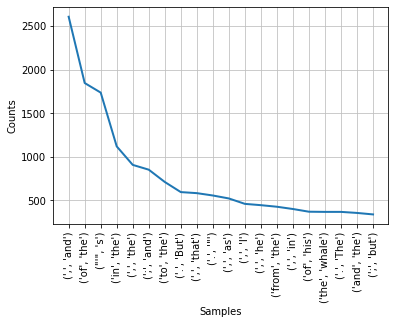

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [6]:
fdist.plot(20)

## Filtrado de bi-gramas
* Sin embargo, observamos que los bi-gramas más comunes no representan realmente frases o estructuras léxicas de interes.
* Tal vez, aplicar algun tipo de filtro nos permita ver estructuras más relevantes.

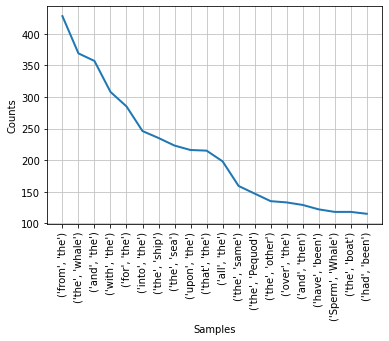

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [7]:
threshold = 2
filtered_bigrams = [bigram for bigram in md_bigrams if len(bigram[0])>threshold and len(bigram[1])>threshold]
filtered_dist = FreqDist(filtered_bigrams)
filtered_dist.plot(20)

# Tri-gramas

In [8]:
from nltk.util import ngrams
md_trigrams = list(ngrams(text1,3))
fdist = FreqDist(md_trigrams)
md_trigrams[:10]

[('[', 'Moby', 'Dick'),
 ('Moby', 'Dick', 'by'),
 ('Dick', 'by', 'Herman'),
 ('by', 'Herman', 'Melville'),
 ('Herman', 'Melville', '1851'),
 ('Melville', '1851', ']'),
 ('1851', ']', 'ETYMOLOGY'),
 (']', 'ETYMOLOGY', '.'),
 ('ETYMOLOGY', '.', '('),
 ('.', '(', 'Supplied')]

In [9]:
fdist.most_common(10)

[((',', 'and', 'the'), 187),
 (('don', "'", 't'), 103),
 (('of', 'the', 'whale'), 101),
 ((',', 'in', 'the'), 93),
 ((',', 'then', ','), 87),
 (('whale', "'", 's'), 81),
 (('.', 'It', 'was'), 81),
 (('ship', "'", 's'), 80),
 (('the', 'Sperm', 'Whale'), 77),
 ((',', 'as', 'if'), 76)]

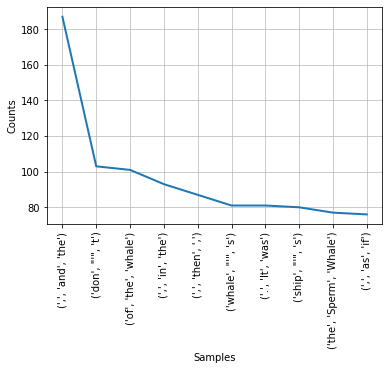

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [10]:
fdist.plot(10)

# Collocations (Colocaciones)

* Son secuencias de palabras que suelen ocurrir en textos o conversaciones con una **frecuencia inusualmente alta** [NLTK doc](http://www.nltk.org/book/ch01.html)
* Las colocaciones de una palabra son declaraciones formales de donde suele ubicarse tipicamente esa palabra [Manning & Schütze, 1990, Foundations of Statistical Natural Language Processing, Capítulo 6](https://nlp.stanford.edu/fsnlp/)

In [11]:
md_bigrams = list(bigrams(text1))

threshold = 2
#distribution of bi-grams
filtered_bigrams = [bigram for bigram in md_bigrams if len(bigram[0])>threshold and len(bigram[1])>threshold]
filtered_bigram_dist = FreqDist(filtered_bigrams)
#distribution of words
filtered_words = [word for word in text1 if len(word)>threshold]
filtered_word_dist = FreqDist(filtered_words)

# Como  si fuera una hoja de cálculo en excel pero en python:
df = pd.DataFrame()
df['bi_gram'] = list(set(filtered_bigrams))
df['word_0'] = df['bi_gram'].apply(lambda x: x[0])
df['word_1'] = df['bi_gram'].apply(lambda x: x[1])
# Frecuencia de aparición del bigrama:
df['bi_gram_freq'] = df['bi_gram'].apply(lambda x: filtered_bigram_dist[x])
# Frecuencia de aparición de las palabras 0 y 1:
df['word_0_freq'] = df['word_0'].apply(lambda x: filtered_word_dist[x])
df['word_1_freq'] = df['word_1'].apply(lambda x: filtered_word_dist[x])
df

,bi_gram,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq
0,"(peculiar, ferocity)",peculiar,ferocity,1,56,4
1,"(but, courteously)",but,courteously,1,1113,1
2,"(the, inn)",the,inn,3,13721,6
3,"(midnight, the)",midnight,the,1,24,13721
4,"(they, must)",they,must,4,586,282
...,...,...,...,...,...,...
67937,"(that, through)",that,through,4,2982,227
67938,"(Fleet, have)",Fleet,have,1,1,760
67939,"(distance, obscuring)",distance,obscuring,1,39,1
67940,"(been, wasted)",been,wasted,1,415,5


# Pointwise Mutual Information (PMI)
Una métrica basada en _teoria de la información_ para encontrar **Collocations**.

**Información mutua punto a punto**:

$$
PMI = \log\left(\frac{P(w_1, w_2)}{P(w_1)P(w_2)}\right)
$$

Probabilidad de que un bigrama con palabras w1 y w2 aparezca entre la probabilidad de aparición de cada palabra.

**El PMI nos da información sobre un bigrama en concreto. Cuando el PMI da un valor muy grande para un bigrama eso significa que dicho bigrama correponde con una COLOCACIÓN:**

In [12]:
df['PMI'] = df[['bi_gram_freq', 'word_0_freq', 'word_1_freq']].apply(lambda x:np.log2(x.values[0]/(x.values[1]*x.values[2])), axis = 1)
df['log(bi_gram_freq)'] = df['bi_gram_freq'].apply(lambda x: np.log2(x))
df

,bi_gram,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
0,"(peculiar, ferocity)",peculiar,ferocity,1,56,4,-7.807355,0.000000
1,"(but, courteously)",but,courteously,1,1113,1,-10.120238,0.000000
2,"(the, inn)",the,inn,3,13721,6,-14.744098,1.584963
3,"(midnight, the)",midnight,the,1,24,13721,-18.329061,0.000000
4,"(they, must)",they,must,4,586,282,-15.334308,2.000000
...,...,...,...,...,...,...,...,...
67937,"(that, through)",that,through,4,2982,227,-17.368613,2.000000
67938,"(Fleet, have)",Fleet,have,1,1,760,-9.569856,0.000000
67939,"(distance, obscuring)",distance,obscuring,1,39,1,-5.285402,0.000000
67940,"(been, wasted)",been,wasted,1,415,5,-11.018896,0.000000


Normalmente la función anterior de PMI, en concreto la división suele dar valores menores que 1 para los cuales el log es negativo. Por lo tanto los bigramas que sean colocaciones deben dar en la división cerca a 0 por lo que el número PMI es menos negativo que otros bigramas que no son colocaciones.

In [13]:
df.sort_values(by = 'PMI', ascending=False)

,bi_gram,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
42435,"(BREAKERS, HEREABOUTS)",BREAKERS,HEREABOUTS,1,1,1,0.000000,0.0
11990,"(unmurmuringly, acquiesced)",unmurmuringly,acquiesced,1,1,1,0.000000,0.0
10549,"(CONTESTED, ELECTION)",CONTESTED,ELECTION,1,1,1,0.000000,0.0
34726,"(unstirring, paralysis)",unstirring,paralysis,1,1,1,0.000000,0.0
60754,"(unsurrenderable, wilfulness)",unsurrenderable,wilfulness,1,1,1,0.000000,0.0
...,...,...,...,...,...,...,...,...
29776,"(man, the)",man,the,1,508,13721,-22.732783,0.0
43558,"(some, the)",some,the,1,578,13721,-22.919024,0.0
43253,"(one, the)",one,the,1,889,13721,-23.540138,0.0
46757,"(the, not)",the,not,1,13721,1103,-23.851315,0.0


Pero si nos fijamos en los primeros bigramas solo aparecen una vez en el texto, incluso sus palabras solo aparecen una vez en todo el texto que estamos considerando. Al final de la tabla, puede que hayan más bigramas que aunque su PMI no sea muy grande puede que tengan una mayor frecuencia de aparición en el texto.

**Por lo tanto no solo debemos fijarnos en la métrica PMI sino mirar también si es muy frecuente este ngrama en el texto**. 

In [14]:
fig = px.scatter(x = df['PMI'].values, y = df['log(bi_gram_freq)'].values, color = df['PMI']+df['log(bi_gram_freq)'], 
                 size = (df['PMI']+df['log(bi_gram_freq)']).apply(lambda x: 1/(1+abs(x))).values, 
                 hover_name = df['bi_gram'].values, width = 600, height = 600, labels = {'x': 'PMI', 'y': 'Log(Bigram Frequency)'})
fig.show()

# Medidas pre-construidas en NLTK

In [ ]:
# ver documentación https://www.nltk.org/_modules/nltk/metrics/association.html
from nltk.collocations import *
bigram_measures = nltk.collocations.BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(text1)

In [ ]:
finder.apply_freq_filter(20)
finder.nbest(bigram_measures.pmi, 10)

[('Moby', 'Dick'),
 ('Sperm', 'Whale'),
 ('White', 'Whale'),
 ('Right', 'Whale'),
 ('Captain', 'Peleg'),
 (',"', 'said'),
 ('never', 'mind'),
 ('!"', 'cried'),
 ('no', 'means'),
 ('each', 'other')]

# Textos en Español 

In [ ]:
# descargamos corpus en español  https://mailman.uib.no/public/corpora/2007-October/005448.html
nltk.download('cess_esp')
corpus = nltk.corpus.cess_esp.sents() 
flatten_corpus = [w for l in corpus for w in l]

[nltk_data] Downloading package cess_esp to /root/nltk_data...
[nltk_data]   Package cess_esp is already up-to-date!


In [ ]:
print(corpus[0])

['El', 'grupo', 'estatal', 'Electricité_de_France', '-Fpa-', 'EDF', '-Fpt-', 'anunció', 'hoy', ',', 'jueves', ',', 'la', 'compra', 'del', '51_por_ciento', 'de', 'la', 'empresa', 'mexicana', 'Electricidad_Águila_de_Altamira', '-Fpa-', 'EAA', '-Fpt-', ',', 'creada', 'por', 'el', 'japonés', 'Mitsubishi_Corporation', 'para', 'poner_en_marcha', 'una', 'central', 'de', 'gas', 'de', '495', 'megavatios', '.']


In [ ]:
print(flatten_corpus[:50])

['El', 'grupo', 'estatal', 'Electricité_de_France', '-Fpa-', 'EDF', '-Fpt-', 'anunció', 'hoy', ',', 'jueves', ',', 'la', 'compra', 'del', '51_por_ciento', 'de', 'la', 'empresa', 'mexicana', 'Electricidad_Águila_de_Altamira', '-Fpa-', 'EAA', '-Fpt-', ',', 'creada', 'por', 'el', 'japonés', 'Mitsubishi_Corporation', 'para', 'poner_en_marcha', 'una', 'central', 'de', 'gas', 'de', '495', 'megavatios', '.', 'Una', 'portavoz', 'de', 'EDF', 'explicó', 'a', 'EFE', 'que', 'el', 'proyecto']


In [ ]:
finder = BigramCollocationFinder.from_documents(corpus)
finder.apply_freq_filter(10)
finder.nbest(bigram_measures.pmi, 10)

[('señora', 'Aguirre'),
 ('secretario', 'general'),
 ('elecciones', 'generales'),
 ('campaña', 'electoral'),
 ('quiere', 'decir'),
 ('Se', 'trata'),
 ('segunda', 'vuelta'),
 ('director', 'general'),
 ('primer', 'ministro'),
 ('primer', 'lugar')]

# Referencias para seguir aprendiendo


*   [Mas sobre Colocaciones con NLTK](http://www.nltk.org/howto/collocations.html)
*   

